### Importando os Pacotes Utilitários

In [ ]:
!pip install lungs_segmentation
!pip install opencv-python==4.1.2.30

from sklearn.model_selection import train_test_split
from bbox_delimiters import bbox_utils
import explainability_algorithms as ea
import occlusion_algorithms as oa
import maps_binarization as mb
import matplotlib.pyplot as plt
import maps_binarization as mb
import urllib.request as url
import compute_probs as cp
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

### Baixando os Conjuntos de Dados

In [ ]:
shutil.unpack_archive(filename = '/content/drive/MyDrive/datasets-lung-loc/CheXpert-v1.0-small.zip', 
                      extract_dir = '/content/CheXpert-v1.0-small', format = 'zip')
shutil.unpack_archive(filename = '/content/drive/MyDrive/datasets-lung-loc/vinbigdata.zip', 
                      extract_dir = '/content/vinbigdata/', format = 'zip')
shutil.unpack_archive(filename = '/content/drive/MyDrive/datasets-lung-loc/images.zip', 
                      extract_dir = '/content/images/', format = 'zip')

### Organizando e Analisando os Dados

In [ ]:
dataset = pd.read_csv('/content/test_geral_dataset.csv', index_col = 0)
findings = ['Opacity', 'Atelectasis', 'Pneumothorax', 'Effusion', 'Abnormal']

count_findings = list()
for finding in findings:
  if finding != 'Abnormal':
    count = dict(dataset[finding].value_counts())[1.0]
    count_findings.append(count)
  else:
    count = dict(dataset[finding].value_counts())[0.0]
    count_findings.append(count)

findings_pt = ['Opacidade', 'Atelectasia', 'Pneumotórax', 'Efusão', 'Normal']

plt.figure(figsize = (20, 10))
plt.bar(findings_pt, count_findings)
plt.xticks(rotation = 0, size = 25)
plt.title('Quantidade de Imagens do Conjunto de Teste Geral', size = 30)
plt.ylabel('Imagens', size = 25)

### Applying Lung Localization to Images

In [ ]:
test_path = list(test_df['Path'])

!cp -r /content/drive/MyDrive/lung-localization/vgg/model_vgg5.zip /content/
!unzip /content/model_vgg5.zip
model_loc = tf.keras.models.load_model('/content/content/model_vgg5')

lung_localization = bbox_utils()

for index, string in enumerate(test_path):
  test_path[index] = '/content/images_loc/' + string

In [ ]:
def make_localization(filename):
  '''
  performs lung localization on radiography images

  Args:
    filename (str) --> image file location
  '''

  coordinates = lung_localization.make_localization_cnn(model = model_loc, path_file = filename)
  image_array = cv2.imread(filename = filename)
  crop_image = lung_localization.crop_image(image = image_array, list_coordinates = coordinates)
  lung_localization.save_img(image = crop_image, path_file = filename)

  return

In [ ]:
_ = list(map(make_localization, test_path))

### Gerador de Imagens do Keras

In [ ]:
core_idg_test1 = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)
core_idg_test2 = ImageDataGenerator(preprocessing_function = tf.keras.applications.densenet.preprocess_input)
core_idg_test3 = ImageDataGenerator(preprocessing_function = tf.keras.applications.inception_v3.preprocess_input)
core_idg_test4 = ImageDataGenerator(preprocessing_function = tf.keras.applications.xception.preprocess_input)
core_idg_test5 = ImageDataGenerator(preprocessing_function = tf.keras.applications.inception_resnet_v2.preprocess_input)
core_idg_test6 = ImageDataGenerator(preprocessing_function = tf.keras.applications.resnet_v2.preprocess_input)

In [ ]:
test_gen_ab1 = core_idg_test1.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)
test_gen_ab2 = core_idg_test2.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)
test_gen_ab3 = core_idg_test3.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)
test_gen_ab4 = core_idg_test4.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)
test_gen_ab5 = core_idg_test5.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)
test_gen_ab6 = core_idg_test6.flow_from_dataframe(dataframe = dataset, directory = None, 
                                                  x_col = 'Path', y_col = findings[-1], 
                                                  class_mode = 'raw', batch_size = batch_size,
                                                  target_size = (image_size, image_size),
                                                  shuffle = False)

In [ ]:
labels_editada = ['Opacidade', 'Lesão', 'Edema', 'Consolidação', 'Atelectasia',
                  'Pneumotórax', 'Efusão Pleural']

def decode_labels(label, list_labels, image = None, model = None, with_pred = False):
  '''
  decodes the vector of model predictions

  Args:
    image (array) --> image for prediction
    label (array) --> model prediction vector
    list_labels (list) --> classification labels name
  
  Return:
    decoded_label (str) --> labels predicted by the model
  '''

  if with_pred:
    predict_labels = np.round(model.predict(image) * 100, 2)[0]
    result = ''
    for index, label in enumerate(label):
      if label == 1:
        if result != '':
          result += f', {list_labels[index]} ({str(predict_labels[index])}%)'
        else:
          result += f'{list_labels[index]} ({str(predict_labels[index])}%)'
  else:
    result = ''
    for index, label in enumerate(label):
      if label == 1:
        if result != '':
          result += f', {list_labels[index]}'
        else:
          result += f'{list_labels[index]}'
  
  return result 

In [ ]:
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

test_X, test_Y = next(test_gen.flow_from_dataframe(
    dataframe = test_df, directory = None, x_col = 'Path',
    y_col = labels, class_mode = 'raw', batch_size = 2517,
    target_size = (image_size, image_size), shuffle = False))

test_X_loc, test_Y_loc = next(test_gen.flow_from_dataframe(
    dataframe = test_df, directory = 'images_loc', x_col = 'Path',
    y_col = labels, class_mode = 'raw', batch_size = 2517,
    target_size = (image_size, image_size), shuffle = False))

Found 2517 validated image filenames.
Found 2517 validated image filenames.


Text(0.5, 0.98, 'Imagens sem o Algoritmo de Localização Pulmonar')

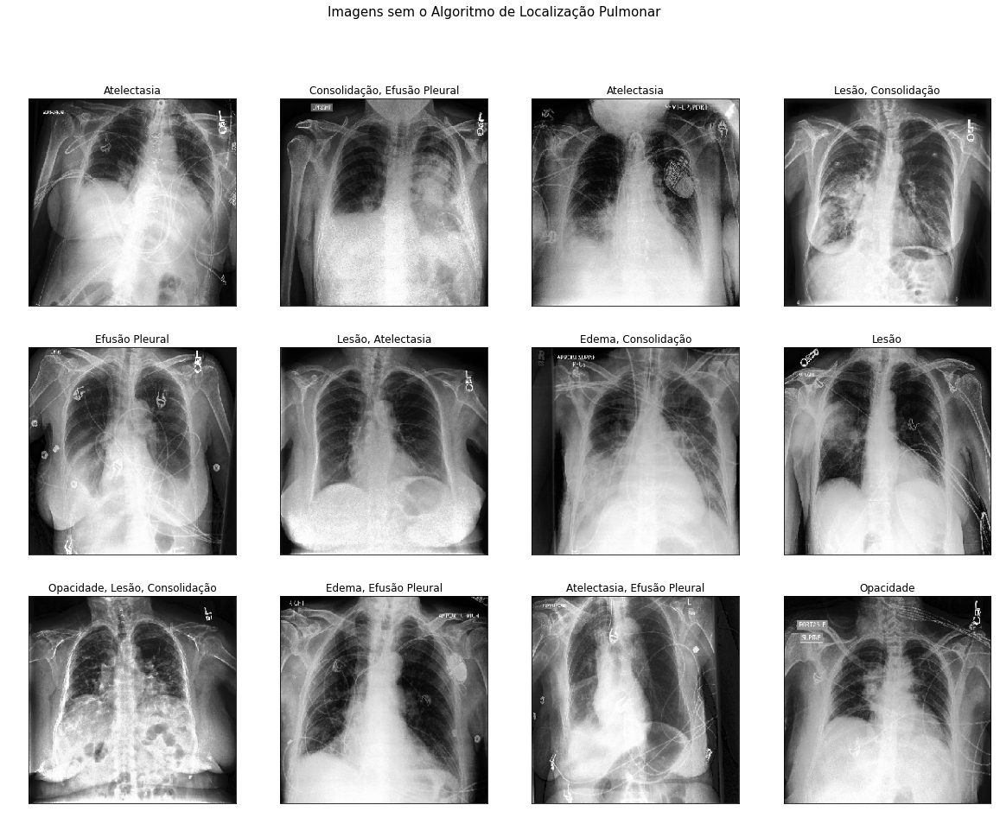

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 4, figsize = (20, 15))

for i in range(0, 3):
  for j in range(0, 4):
    count = random.randrange(0, len(test_Y))
    title = decode_labels(image = test_X[count], label = test_Y[count], 
                          list_labels = labels_editada, with_pred = False)
    axs[i, j].set_title(title, color = 'black')
    axs[i, j].imshow(test_X[count])

plt.suptitle('Imagens sem o Algoritmo de Localização Pulmonar', size = 15, 
             color = 'black')

Text(0.5, 0.98, 'Imagens com o Algoritmo de Localização Pulmonar')

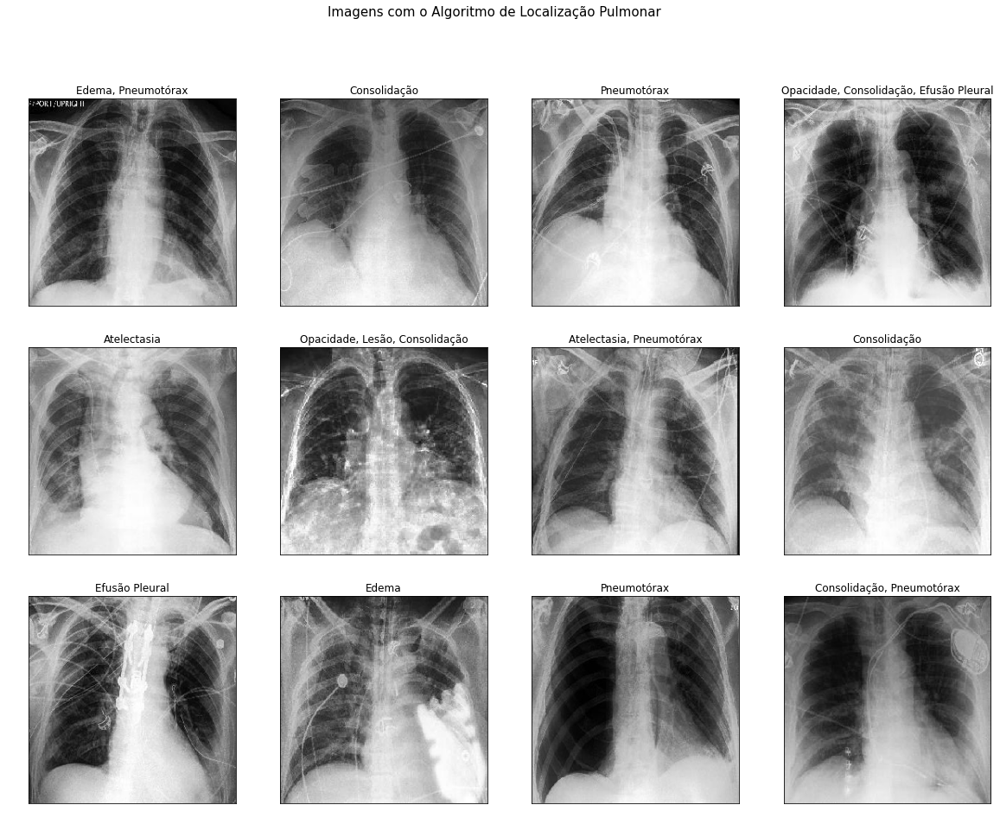

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 4, figsize = (20, 15))

for i in range(0, 3):
  for j in range(0, 4):
    count = random.randrange(0, len(test_Y_loc))
    title = decode_labels(label = test_Y[count], 
                          list_labels = labels_editada, with_pred = False)
    axs[i, j].set_title(title, color = 'black')
    axs[i, j].imshow(test_X_loc[count])

plt.suptitle('Imagens com o Algoritmo de Localização Pulmonar', size = 15, 
             color = 'black')

### Downloading and Loading the Trained Models

In [ ]:
!cp -r /content/drive/MyDrive/lung-localization/classification-tests/ /content/
!cp -r /content/drive/MyDrive/experimentos/experimento/chexpert /content/ 
!unzip /content/classification-tests/densenet121_model.zip

In [ ]:
densenet_model_loc = tf.keras.models.load_model('/content/content/densenet121_model')
densenet_model = tf.keras.models.load_model('/content/chexpert/densenet121-model')
densenet_model.load_weights('/content/chexpert/model.densenet121.h5')

densenet_model_loc_copy = ea.copy_model(model = densenet_model_loc)
densenet_model_copy = ea.copy_model(model = densenet_model)

### Viewing Activation Maps in Test Images

#### Trained Model with Lung Localization

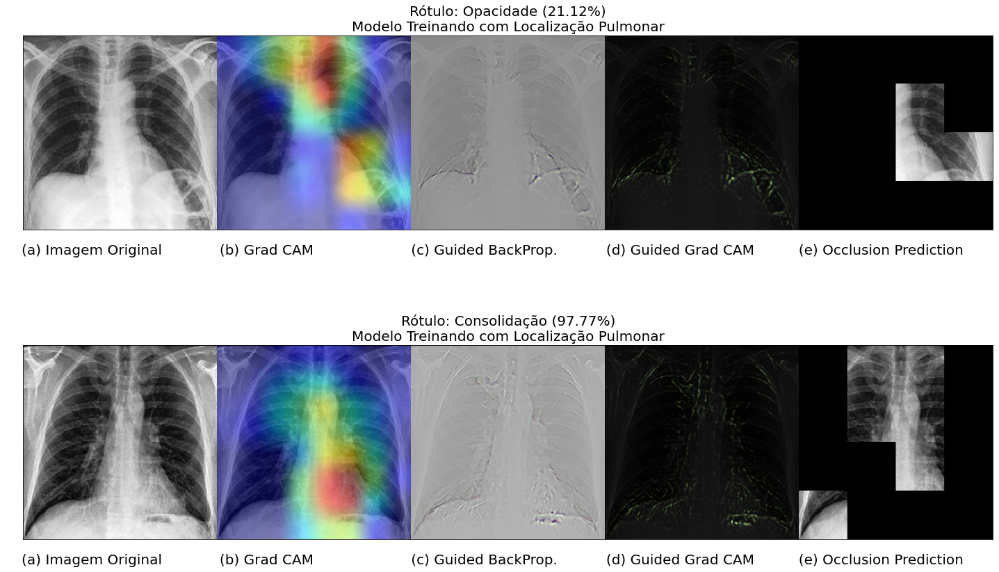

In [ ]:
save_counts = list()
fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (25, 15))

for i in range(0, 2):
  count = random.randrange(0, len(test_X_loc))
  _, img_b = ea.get_grad_cam(img_array = tf.expand_dims(test_X_loc[count], 0),
                             last_conv_layer_name = 'conv5_block16_2_conv',
                             copy_model = densenet_model_loc_copy) 
  img_c = ea.guided_backpropagation(img_array = tf.expand_dims(test_X_loc[count], 0),
                                    model = densenet_model_loc,
                                    last_conv_layer_name = 'conv5_block16_2_conv') 
  img_c = test_X_loc[count] * 0.2 + img_c * 2
  img_c = img_c / np.max(img_c)
  img_d = ea.guided_grad_cam(img_array = tf.expand_dims(test_X_loc[count], 0),
                             last_conv_layer_name = 'conv5_block16_2_conv', 
                             model = densenet_model_loc,
                             copy_model = densenet_model_loc_copy) 
  img_d = test_X_loc[count] * 0.2 + img_d * 2
  img_d  = img_d / np.max(img_d)
  img_e = oa.occlusion_prediction(img_array = tf.expand_dims(test_X_loc[count], 0),
                                  patch_size = 64, channels = 3, patches_dims = (4,4),  
                                  model = densenet_model_loc, val_occlusion = 0)
  img_concat = np.concatenate((test_X_loc[count], img_b, img_c, img_d, img_e), 
                               axis = 1)
  axs[i].imshow(img_concat, vmin = np.min(img_concat), 
                vmax = np.max(img_concat))
  title = decode_labels(label = test_Y_loc[count], list_labels = labels_editada,
                        image = tf.expand_dims(test_X_loc[count], 0), 
                        model = densenet_model_loc, with_pred = True)
  axs[i].set_title(f'Rótulo: {title}'
                    '\nModelo Treinando com Localização Pulmonar', color = 'black', size = 20)
  axs[i].set_xlabel('(a) Imagem Original             '
                    '(b) Grad CAM                      '
                    '(c) Guided BackProp.           '
                    '(d) Guided Grad CAM          '
                    '(e) Occlusion Prediction       ',
                    color = 'black', size = 20)
  save_counts.append(count)

#### Trained Model without Lung Localization

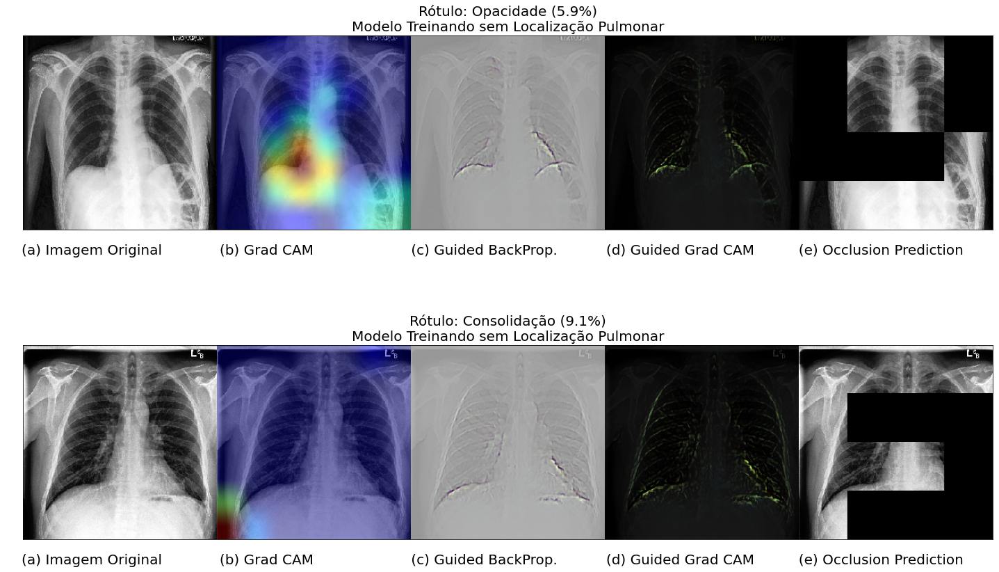

In [ ]:
fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (25, 15))

for i in range(0, 2):
  _, img_b = ea.get_grad_cam(img_array = tf.expand_dims(test_X[save_counts[i]], 0),
                             last_conv_layer_name = 'conv5_block16_2_conv',
                             copy_model = densenet_model_copy) 
  img_c = ea.guided_backpropagation(img_array = tf.expand_dims(test_X[save_counts[i]], 0),
                                    model = densenet_model,
                                    last_conv_layer_name = 'conv5_block16_2_conv') 
  img_c = test_X[save_counts[i]] * 0.2 + img_c * 2
  img_c = img_c / np.max(img_c)
  img_d = ea.guided_grad_cam(img_array = tf.expand_dims(test_X[save_counts[i]], 0),
                             last_conv_layer_name = 'conv5_block16_2_conv', 
                             model = densenet_model,
                             copy_model = densenet_model_copy) 
  img_d = test_X[save_counts[i]] * 0.2 + img_d * 2
  img_d  = img_d / np.max(img_d)
  img_e = oa.occlusion_prediction(img_array = tf.expand_dims(test_X[save_counts[i]], 0),
                                  patch_size = 64, channels = 3, patches_dims = (4,4),  
                                  model = densenet_model, val_occlusion = 0)
  img_concat = np.concatenate((test_X[save_counts[i]], img_b, img_c, img_d, img_e), 
                               axis = 1)
  axs[i].imshow(img_concat, vmin = np.min(img_concat), 
                vmax = np.max(img_concat))
  title = decode_labels(label = test_Y[save_counts[i]], list_labels = labels_editada,
                        image = tf.expand_dims(test_X[save_counts[i]], 0), 
                        model = densenet_model, with_pred = True)
  axs[i].set_title(f'Rótulo: {title}'
                    '\nModelo Treinando sem Localização Pulmonar', color = 'black', size = 20)
  axs[i].set_xlabel('(a) Imagem Original             '
                    '(b) Grad CAM                      '
                    '(c) Guided BackProp.           '
                    '(d) Guided Grad CAM          '
                    '(e) Occlusion Prediction       ',
                    color = 'black', size = 20)

### Viewing Activation Maps in Radiopaedia Images

#### Opacity

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Opacidade.jpg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Opacidade.jpg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Opacidade.jpg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Opacidade - Anotada.jpg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Opacidade (75.32%)
Modelo Treinando com Localização Pulmonar


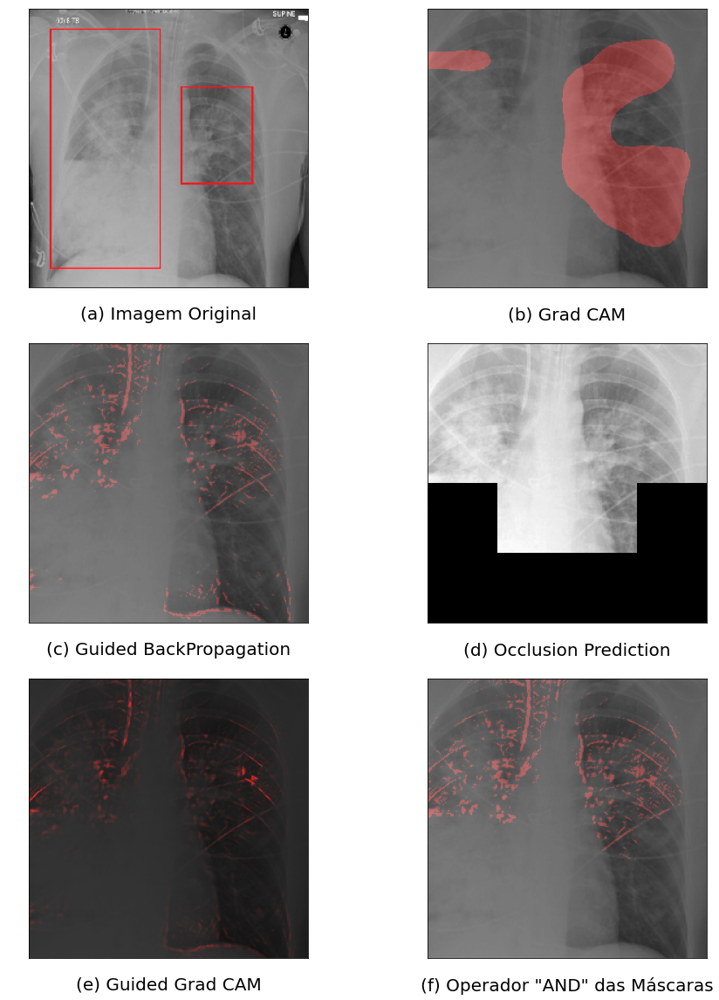

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [1, 0, 0, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Opacidade (15.98%)
Modelo Treinando sem Localização Pulmonar


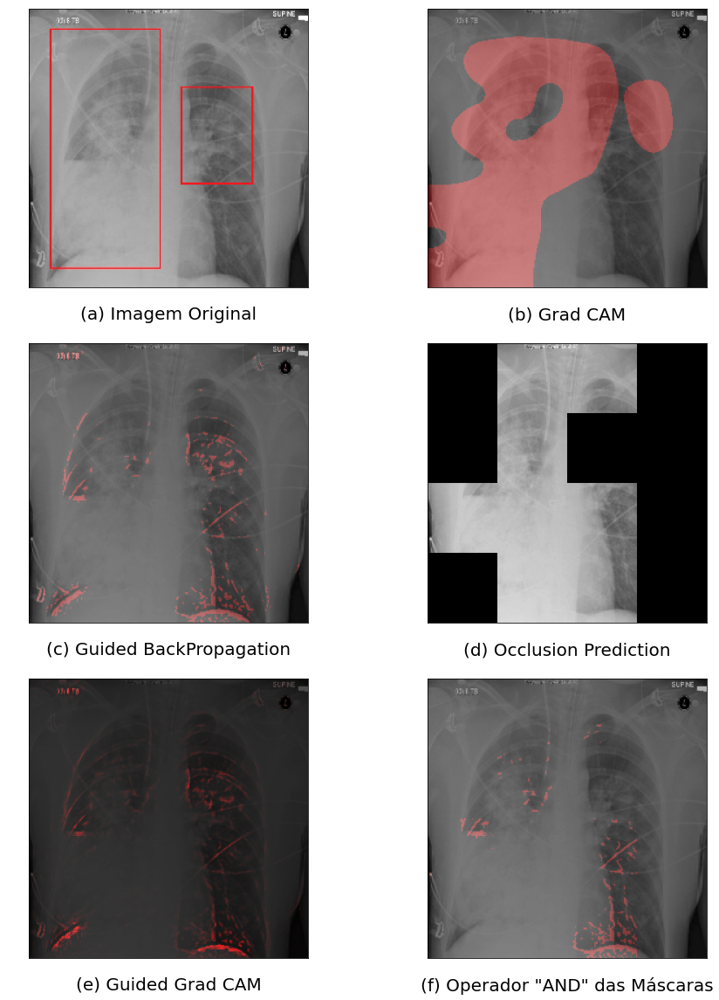

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [1, 0, 0, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Lesion

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Lesão.jpg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Lesão.jpg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Lesão.jpg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Lesão - Anotada.jpg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Lesão (99.94%)
Modelo Treinando com Localização Pulmonar


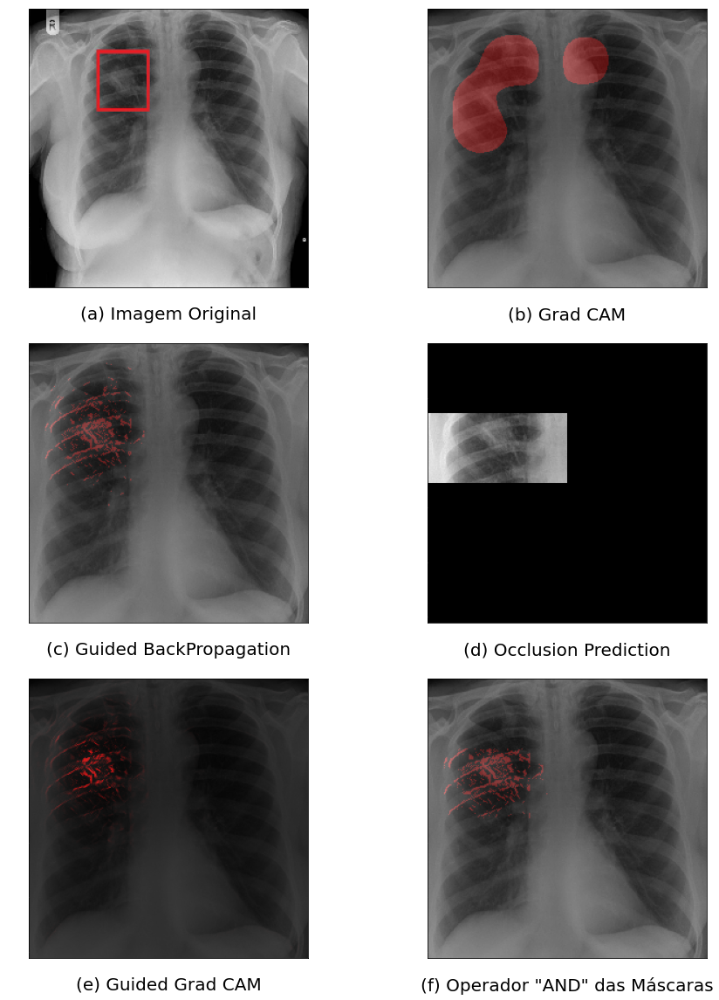

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 1, 0, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Lesão (74.25%)
Modelo Treinando sem Localização Pulmonar


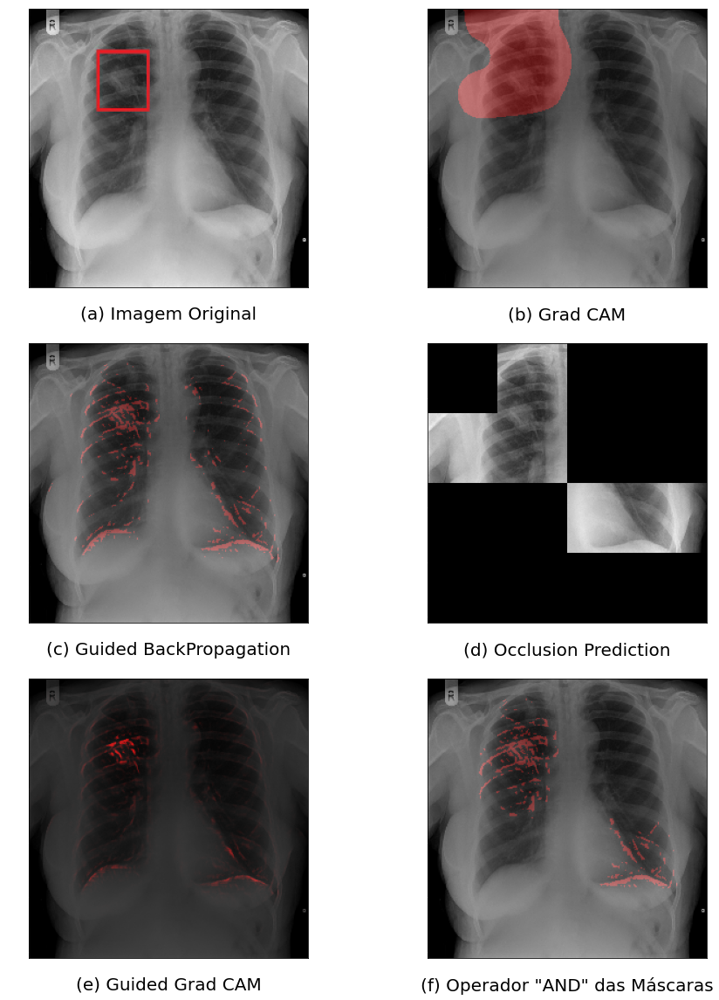

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 1, 0, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Edema

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Edema.jpg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Edema.jpg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Edema.jpg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Edema - Anotada.jpg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Edema (0.51%)
Modelo Treinando com Localização Pulmonar


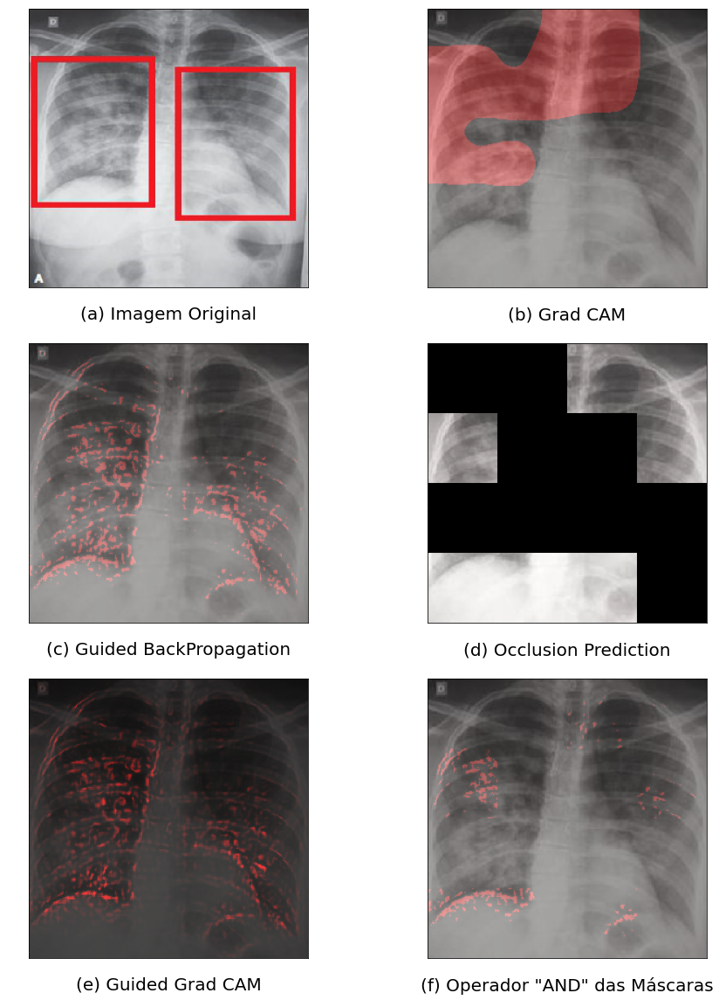

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 1, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Edema (2.15%)
Modelo Treinando sem Localização Pulmonar


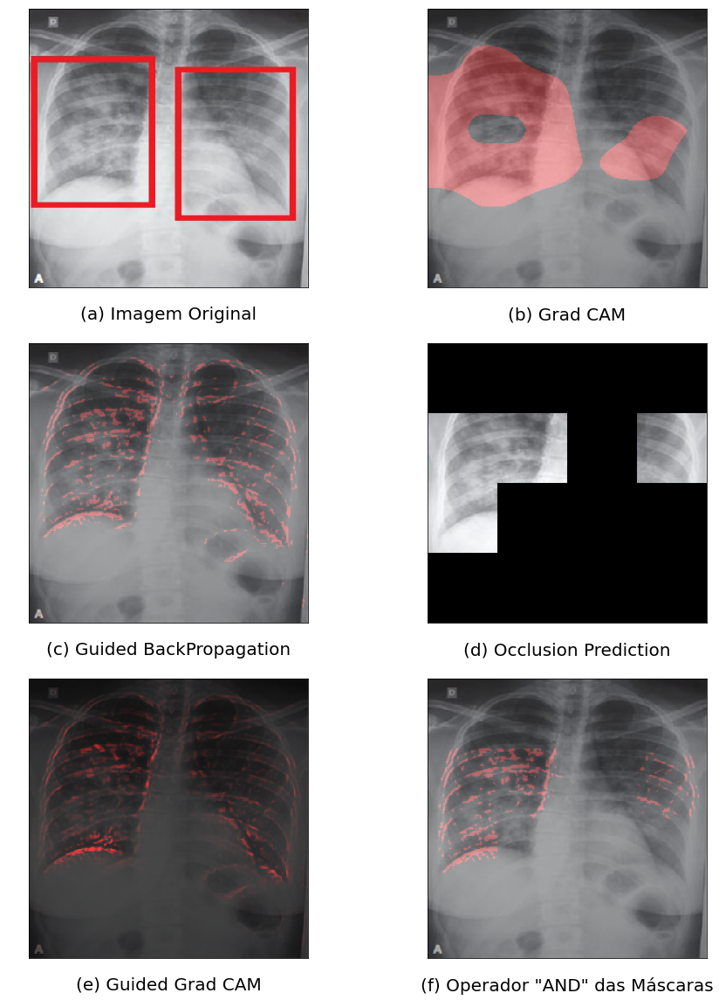

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 1, 0, 0, 0, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Consolidation

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Consolidação.jpg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Consolidação.jpg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Consolidação.jpg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Consolidação - Anotada.jpg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Consolidação (69.93%)
Modelo Treinando com Localização Pulmonar


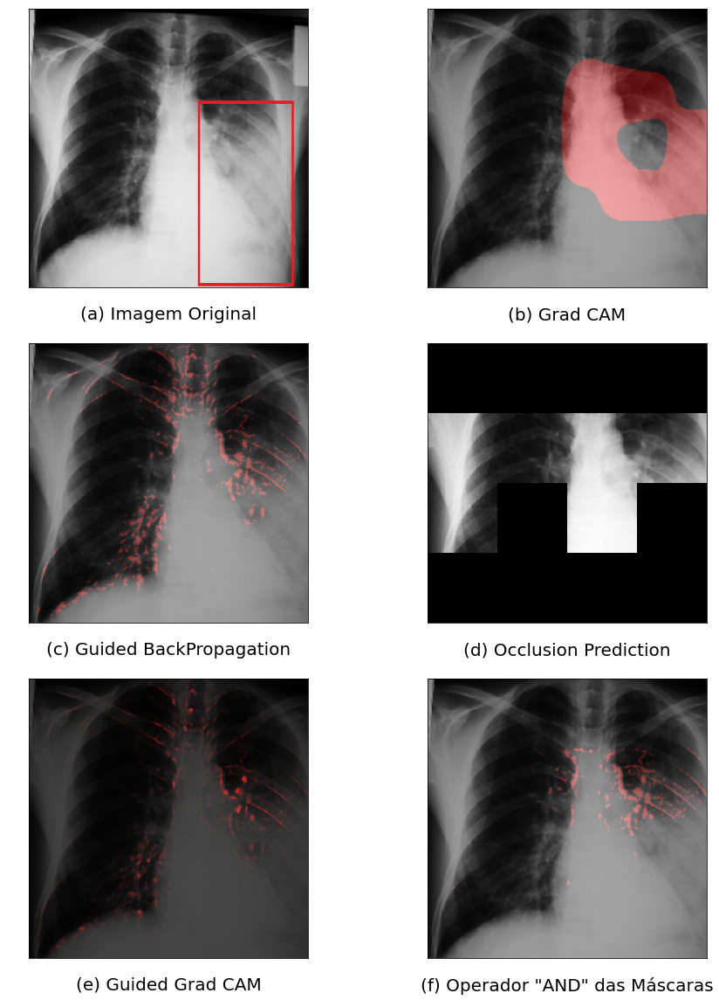

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 1, 0, 0, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Consolidação (62.17%)
Modelo Treinando sem Localização Pulmonar


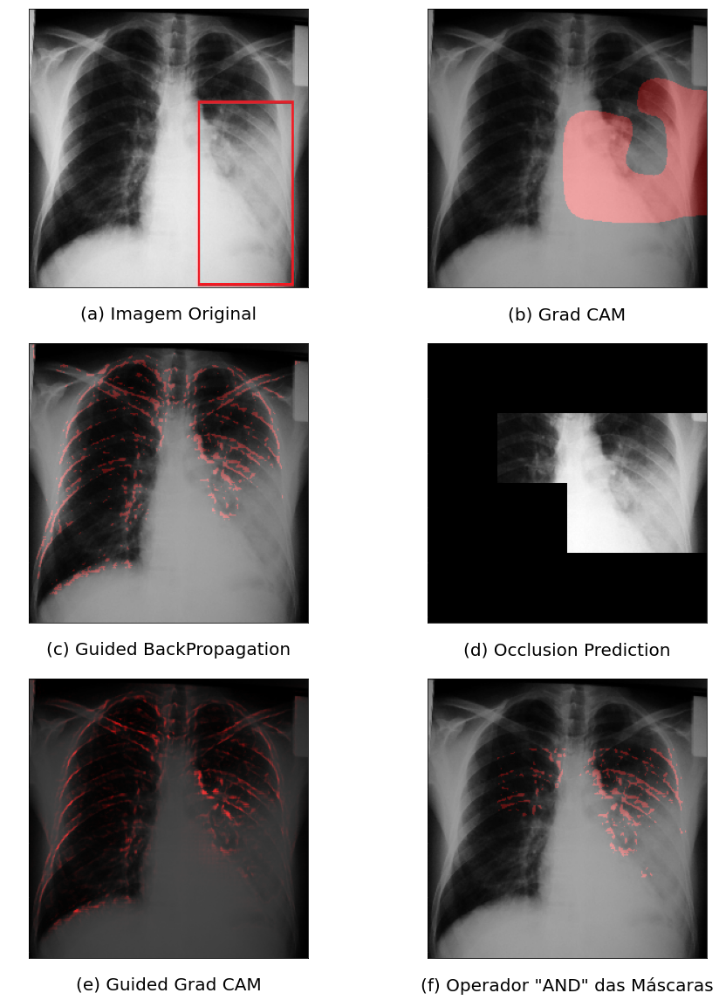

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 1, 0, 0, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Atelectasis

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Atelectasia.jpeg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Atelectasia.jpeg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Atelectasia.jpeg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Atelectasia - Anotada.jpeg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Atelectasia (56.68%)
Modelo Treinando com Localização Pulmonar


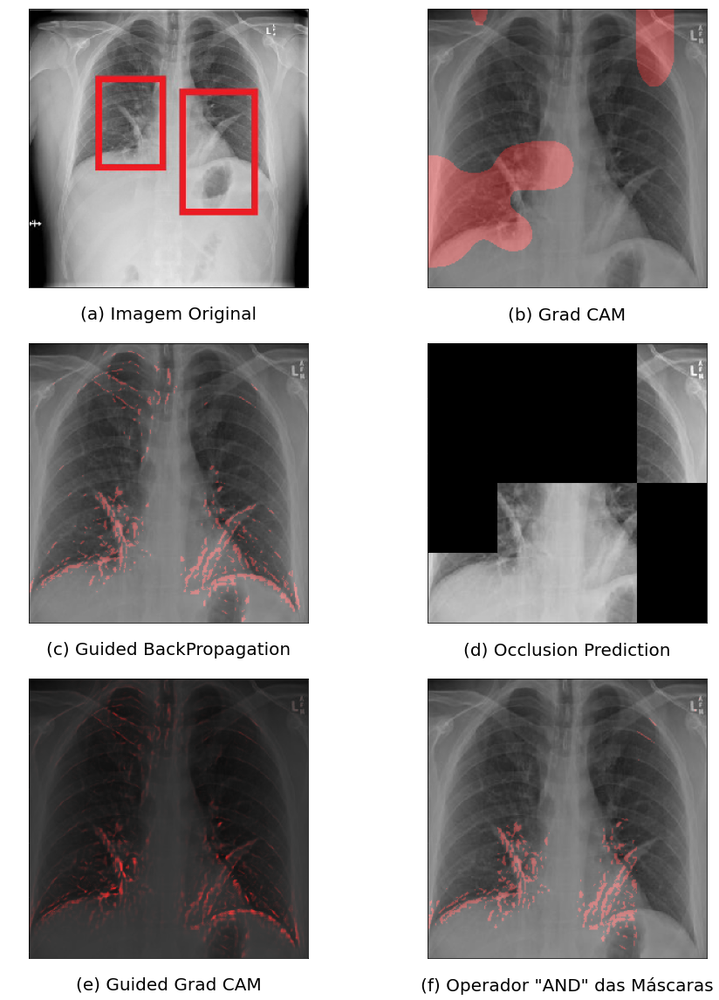

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 1, 0, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Atelectasia (37.39%)
Modelo Treinando sem Localização Pulmonar


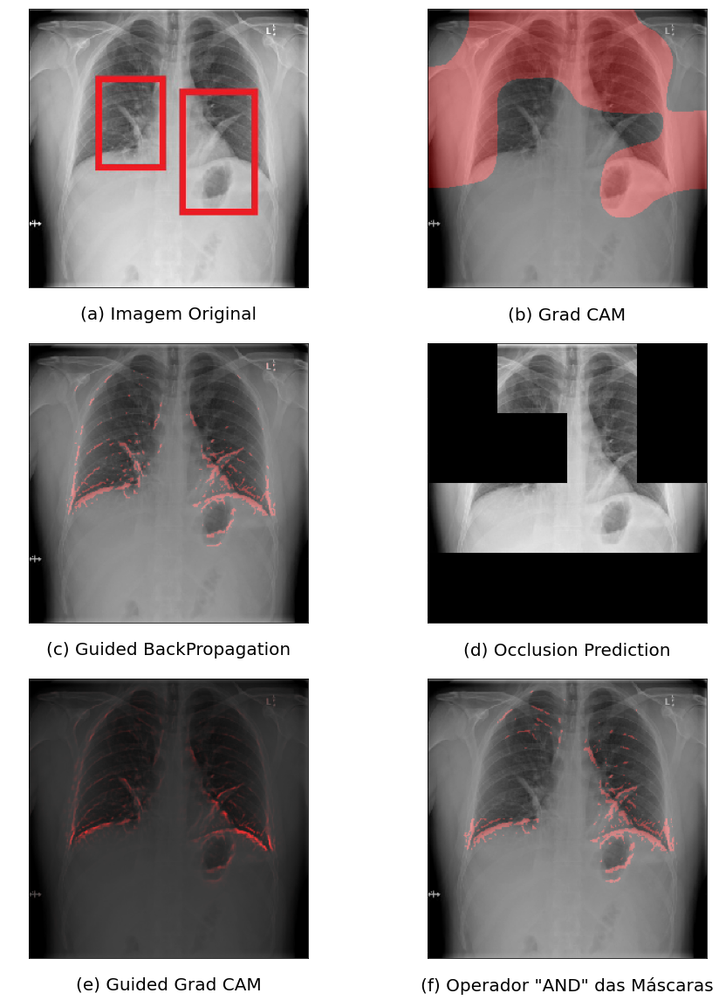

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 1, 0, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Pneumothorax

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Pneumotórax.jpeg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Pneumotórax.jpeg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Pneumotórax.jpeg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Pneumotórax - Anotada.jpeg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Pneumotórax (98.83%)
Modelo Treinando com Localização Pulmonar


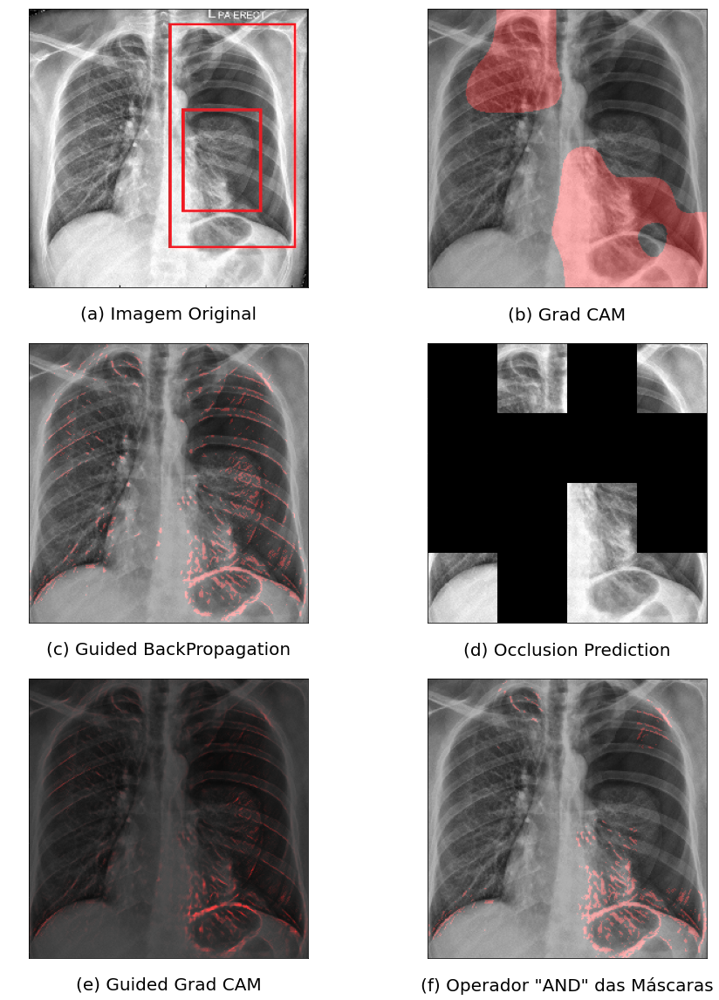

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 0, 1, 0], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Pneumotórax (31.21%)
Modelo Treinando sem Localização Pulmonar


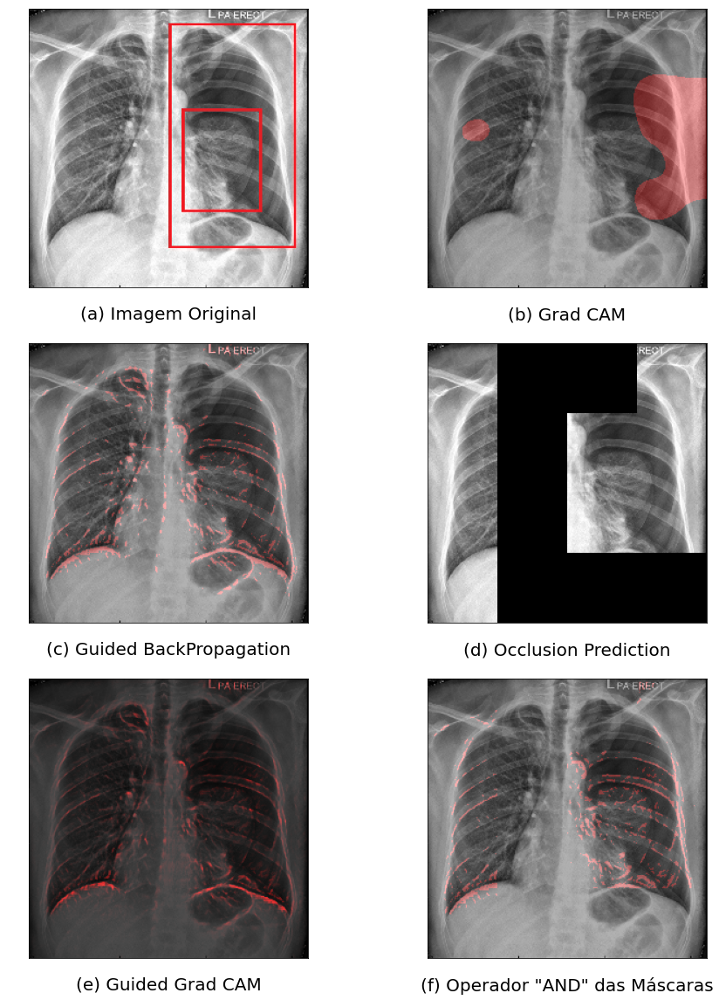

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 0, 1, 0], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

#### Pleural Effusion

In [ ]:
img = ea.get_img_array(img_path = '/content/images_radiopaedia/images_without_loc/Efusão Pleural.jpeg', 
                       target_size = (256, 256))
make_localization(filename = '/content/images_radiopaedia/images_with_loc/Efusão Pleural.jpeg')
img_loc = ea.get_img_array(img_path = '/content/images_radiopaedia/images_with_loc/Efusão Pleural.jpeg', 
                       target_size = (256, 256))
img_mark = ea.get_img_array(img_path = '/content/images_radiopaedia/regions_mark/Efusão Pleural - Anotada.jpeg', 
                       target_size = (256, 256))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Efusão Pleural (95.91%)
Modelo Treinando com Localização Pulmonar


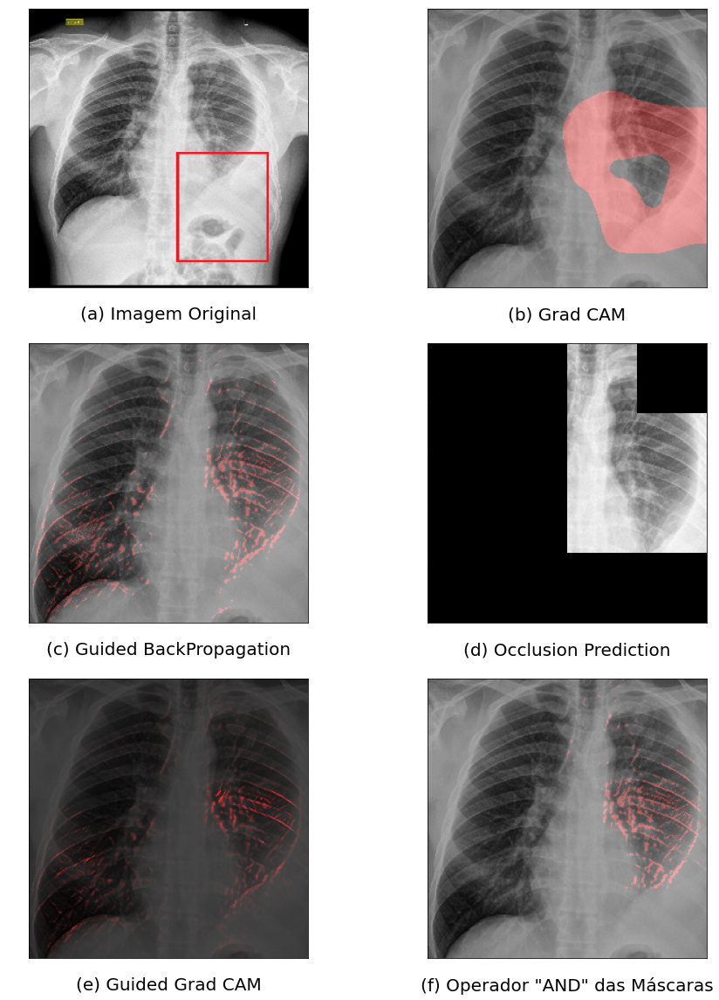

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img_loc, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_loc_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img_loc[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img_loc[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img_loc,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img_loc,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model_loc,
                           copy_model = densenet_model_loc_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))

axs[2][0].imshow(img_loc[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img_loc, model = densenet_model_loc, 
                                     copy_model = densenet_model_loc_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img_loc,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model_loc, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img_loc[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 0, 0, 1], list_labels = labels_editada,
                      image = img_loc, 
                      model = densenet_model_loc, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando com Localização Pulmonar')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rótulo: Efusão Pleural (27.3%)
Modelo Treinando sem Localização Pulmonar


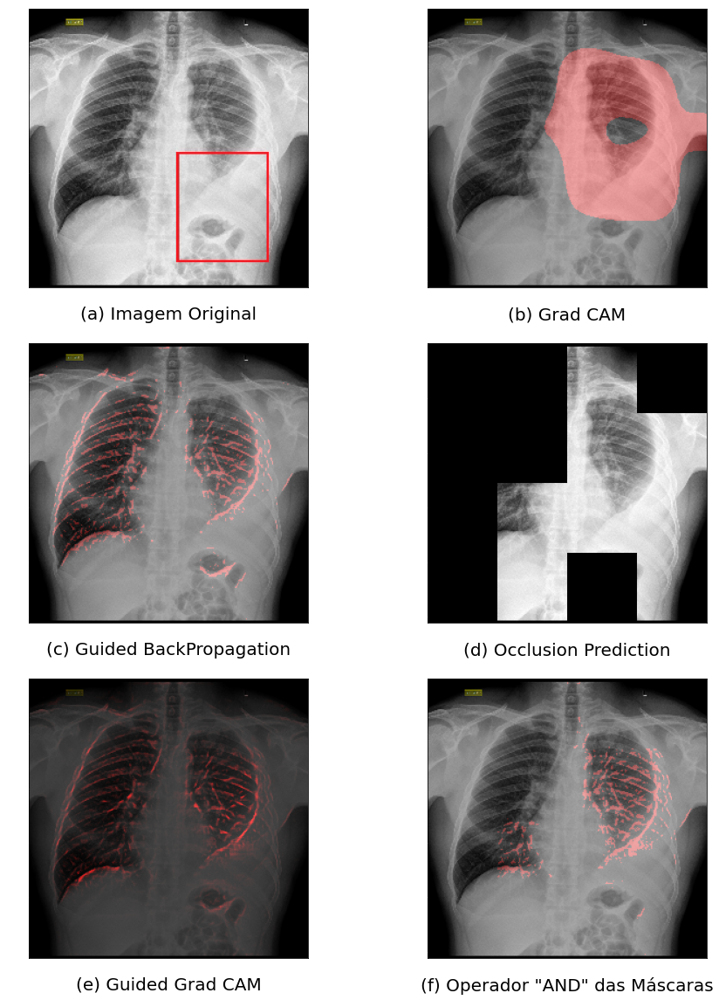

In [ ]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 20))

axs[0][0].imshow(img_mark[0])
axs[0][0].set_xlabel('(a) Imagem Original', color = 'black', size = 20) 

img_b = mb.extract_gradcam_otsu(img_array = img, 
                                last_conv_layer_name = 'conv5_block16_2_conv',
                                copy_model = densenet_model_copy)
img_b = np.dstack((img_b, np.zeros(img_b.shape), np.zeros(img_b.shape)))
axs[0][1].imshow(img[0])
axs[0][1].imshow(img_b, cmap = 'gray', alpha = 0.3)
axs[0][1].set_xlabel('(b) Grad CAM', color = 'black', size = 20)

img_c = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_backpropagation')
img_c = np.dstack((img_c, np.zeros(img_c.shape), np.zeros(img_c.shape)))
axs[1][0].imshow(img[0])
axs[1][0].imshow(img_c, cmap = 'gray', alpha = 0.3)
axs[1][0].set_xlabel('(c) Guided BackPropagation', color = 'black', size = 20)

img_d = oa.occlusion_prediction(img_array = img,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)
axs[1][1].imshow(img_d)
axs[1][1].set_xlabel('(d) Occlusion Prediction', color = 'black', size = 20)

img_e = ea.guided_grad_cam(img_array = img,
                           last_conv_layer_name = 'conv5_block16_2_conv', 
                           model = densenet_model,
                           copy_model = densenet_model_copy) 
img_e = np.dstack((img_e[:, :, 0] + img_e[:, :, 1]+ img_e[:, :, 2], 
                   np.zeros(img_e[:, :, 0].shape), np.zeros(img_e[:, :, 0].shape)))
axs[2][0].imshow(img[0])
axs[2][0].imshow(img_e, cmap = 'gray', alpha = 0.7)
axs[2][0].set_xlabel('(e) Guided Grad CAM', color = 'black', size = 20)

result1 = mb.extract_backpropagation(img_array = img, model = densenet_model, 
                                     copy_model = densenet_model_copy, 
                                     last_conv_layer_name = 'conv5_block16_2_conv', 
                                     type = 'guided_gradcam')
result2 = mb.extract_occlusion(img_array = img,
                              patch_size = 64, channels = 3, patches_dims = (4,4),  
                              model = densenet_model, val_occlusion = 0)

and_img = np.zeros(result1.shape)
for i in range(0, 256):
  for j in range(0, 256):
    if (result1[i][j] == 1) and (result2[i][j] == 1):
      and_img[i][j] = 1

and_img = np.dstack((and_img, np.zeros(and_img.shape), np.zeros(and_img.shape)))
axs[2][1].imshow(img[0])
axs[2][1].imshow(and_img, cmap = 'gray', alpha = 0.3)
axs[2][1].set_xlabel('(f) Operador "AND" das Máscaras', color = 'black', size = 20)

title = decode_labels(label = [0, 0, 0, 0, 0, 0, 1], list_labels = labels_editada,
                      image = img, 
                      model = densenet_model, with_pred = True)
print(f'Rótulo: {title}')
print('Modelo Treinando sem Localização Pulmonar')

### Quantitative Testing of Class Activation Maps

In [ ]:
model_segmentation = lung_localization.model_segmentation()

#### Quantitative Tests in the Model with Pulmonary Localization

In [ ]:
gradcam, guided_back, occlusion, guided_grad, and_op = [], [], [], [], []

for img_path in test_path:

  _, mask = lung_localization.make_segmentation(model = model_segmentation, 
                                      path_image = img_path)
  mask = lung_localization.join_masks(lung_left = mask[0], lung_right = mask[1])
  mask = cv2.resize(mask, (256, 256))

  img_a = ea.get_img_array(img_path = img_path, target_size = (256, 256))

  img_b = mb.extract_gradcam_otsu(img_array = img_a, 
                                  last_conv_layer_name = 'conv5_block16_2_conv',
                                  copy_model = densenet_model_loc_copy)

  img_c = mb.extract_backpropagation(img_array = img_a, model = densenet_model_loc, 
                                      copy_model = densenet_model_loc_copy, 
                                      last_conv_layer_name = 'conv5_block16_2_conv', 
                                      type = 'guided_backpropagation')
  img_d = mb.extract_occlusion(img_array = img_a,
                                  patch_size = 64, channels = 3, patches_dims = (4,4),  
                                  model = densenet_model_loc, val_occlusion = 0)

  result1 = mb.extract_backpropagation(img_array = img_a, model = densenet_model_loc, 
                                      copy_model = densenet_model_loc_copy, 
                                      last_conv_layer_name = 'conv5_block16_2_conv', 
                                      type = 'guided_gradcam')
  result2 = mb.extract_occlusion(img_array = img_a,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model_loc, val_occlusion = 0)

  and_img = np.zeros(result1.shape)
  for i in range(0, 256):
    for j in range(0, 256):
      if (result1[i][j] == 1) and (result2[i][j] == 1):
        and_img[i][j] = 1
  
  gradcam.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_b))
  guided_back.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_c))
  occlusion.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_d))
  guided_grad.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = result1))
  and_op.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = and_img))

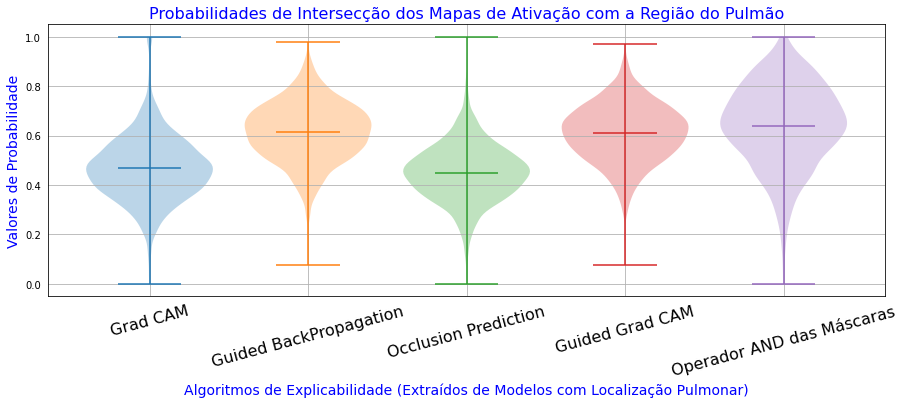

In [ ]:
plt.figure(figsize = (15, 5))

plt.violinplot(gradcam, positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(guided_back, positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(occlusion, positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(guided_grad, positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(and_op, positions = [5], showmeans = True, widths = 0.8)

x_labels = ['Grad CAM', 'Guided BackPropagation', 'Occlusion Prediction', 
            'Guided Grad CAM', 'Operador AND das Máscaras']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black',
           rotation = 15)
plt.yticks(color = 'black')
plt.xlabel('Algoritmos de Explicabilidade (Extraídos de Modelos com Localização Pulmonar)', 
           size = 14, color = 'blue')
plt.ylabel('Valores de Probabilidade', size = 14, color = 'blue')
plt.title('Probabilidades de Intersecção dos Mapas de Ativação com a Região do Pulmão', 
          size = 16, color = 'blue')
plt.grid(True)

In [ ]:
mean_gradcam = np.mean(gradcam) 
mean_guided_back = np.mean(guided_back)
mean_occlusion = np.mean(occlusion) 
mean_guided_grad = np.mean(guided_grad)
mean_and_op = np.mean(and_op)

print('Média das Probabilidades (Imagens de Teste)')
print('Grad CAM: {:.2f}%'.format(mean_gradcam * 100))
print('Guided BackPropagation: {:.2f}%'.format(mean_guided_back * 100))
print('Occlusion Prediction: {:.2f}%'.format(mean_occlusion * 100))
print('Guided Grad CAM: {:.2f}%'.format(mean_guided_grad * 100))
print('Operador "AND" dos Mapas: {:.2f}%'.format(mean_and_op * 100))

Média das Probabilidades (Imagens de Teste)
Grad CAM: 46.79%
Guided BackPropagation: 61.38%
Occlusion Prediction: 44.95%
Guided Grad CAM: 60.88%
Operador "AND" dos Mapas: 64.00%


#### Quantitative Tests in the Model without Pulmonary Localization

In [ ]:
gradcam_, guided_back_, occlusion_, guided_grad_, and_op_ = [], [], [], [], []

for img_path in test_path:

  img_path = img_path.replace('/images_loc', '')
  _, mask = lung_localization.make_segmentation(model = model_segmentation, 
                                      path_image = img_path)
  mask = lung_localization.join_masks(lung_left = mask[0], lung_right = mask[1])
  mask = cv2.resize(mask, (256, 256))

  img_a = ea.get_img_array(img_path = img_path, target_size = (256, 256))

  img_b = mb.extract_gradcam_otsu(img_array = img_a, 
                                  last_conv_layer_name = 'conv5_block16_2_conv',
                                  copy_model = densenet_model_copy)

  img_c = mb.extract_backpropagation(img_array = img_a, model = densenet_model, 
                                      copy_model = densenet_model_copy, 
                                      last_conv_layer_name = 'conv5_block16_2_conv', 
                                      type = 'guided_backpropagation')
  img_d = mb.extract_occlusion(img_array = img_a,
                                  patch_size = 64, channels = 3, patches_dims = (4,4),  
                                  model = densenet_model, val_occlusion = 0)

  result1 = mb.extract_backpropagation(img_array = img_a, model = densenet_model, 
                                      copy_model = densenet_model_copy, 
                                      last_conv_layer_name = 'conv5_block16_2_conv', 
                                      type = 'guided_gradcam')
  result2 = mb.extract_occlusion(img_array = img_a,
                                patch_size = 64, channels = 3, patches_dims = (4,4),  
                                model = densenet_model, val_occlusion = 0)

  and_img = np.zeros(result1.shape)
  for i in range(0, 256):
    for j in range(0, 256):
      if (result1[i][j] == 1) and (result2[i][j] == 1):
        and_img[i][j] = 1
  
  gradcam_.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_b))
  guided_back_.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_c))
  occlusion_.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = img_d))
  guided_grad_.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = result1))
  and_op_.append(cp.intersect_seg_map_prob(image_segmentation = mask, image_map = and_img))

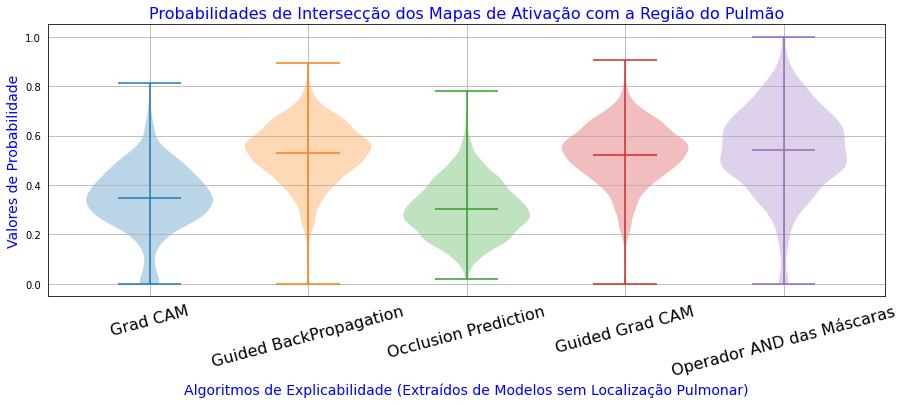

In [ ]:
plt.figure(figsize = (15, 5))

plt.violinplot(gradcam_, positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(guided_back_, positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(occlusion_, positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(guided_grad_, positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(and_op_, positions = [5], showmeans = True, widths = 0.8)

x_labels = ['Grad CAM', 'Guided BackPropagation', 'Occlusion Prediction', 
            'Guided Grad CAM', 'Operador AND das Máscaras']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black',
           rotation = 15)
plt.yticks(color = 'black')
plt.xlabel('Algoritmos de Explicabilidade (Extraídos de Modelos sem Localização Pulmonar)', 
           size = 14, color = 'blue')
plt.ylabel('Valores de Probabilidade', size = 14, color = 'blue')
plt.title('Probabilidades de Intersecção dos Mapas de Ativação com a Região do Pulmão', 
          size = 16, color = 'blue')
plt.grid(True)

In [ ]:
mean_gradcam = np.mean(gradcam_) 
mean_guided_back = np.mean(guided_back_)
mean_occlusion = np.mean(occlusion_) 
mean_guided_grad = np.mean(guided_grad_)
mean_and_op = np.mean(and_op_)

print('Média das Probabilidades (Imagens de Teste)')
print('Grad CAM: {:.2f}%'.format(mean_gradcam * 100))
print('Guided BackPropagation: {:.2f}%'.format(mean_guided_back * 100))
print('Occlusion Prediction: {:.2f}%'.format(mean_occlusion * 100))
print('Guided Grad CAM: {:.2f}%'.format(mean_guided_grad * 100))
print('Operador "AND" dos Mapas: {:.2f}%'.format(mean_and_op * 100))

Média das Probabilidades (Imagens de Teste)
Grad CAM: 34.69%
Guided BackPropagation: 52.72%
Occlusion Prediction: 30.06%
Guided Grad CAM: 52.11%
Operador "AND" dos Mapas: 54.13%
